In [1]:
import os
import configparser
import multiprocessing as mp
from datetime import datetime
import glob

from src.data_formatting_and_upload import data_formatting
from src.image_preprocessing_module import image_preprocessing
from src.quality_assessment_and_quality_control import qa_qc
from src_knmi.table_and_cell_detection_model_knmi import table_and_cell_detection
from src.transcription import transcription
from src.validation import validate

/home/teun/knmi/meteosaver/MeteoSaver/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Module 1: Configuration
# Load settings from user configurations. See configuration.ini file in this repository
config = configparser.ConfigParser()
# Adjust path to config.ini (since it's placed in the root directory)
# config_file_path = os.path.join(os.path.dirname(
    # os.path.dirname(__file__)), 'configuration.ini')
config.read('configuration.ini')

# Get run_mode and number of processors from configuration file
run_mode = config['General']['run_mode']
num_processors = int(config['General'].get('num_processors', 1))

# Set up directories from the configuration file
full_datadir = config['Directories']['full_datadir'] # Directory to all the images/scans of the hydroclimatic data sheets
pre_QA_QC_transcribed_hydroclimate_data_dir = config['Directories']['pre_QA_QC_transcribed_hydroclimate_data_dir'] # Directory where pre-QA/QC transcribed data is stored
post_QA_QC_transcribed_hydroclimate_data_dir = config['Directories']['post_QA_QC_transcribed_hydroclimate_data_dir'] # Directory where post-QA/QC transcribed data is stored
final_refined_daily_hydroclimate_data_dir = config['Directories']['final_refined_daily_hydroclimate_data_dir'] # Directory for the final refined daily hydroclimate data (after all quality checks)
manually_transcribed_data_dir = config['Directories']['manually_transcribed_data_dir'] # Directory for manually transcribed data (used for validation)
validation_dir = config['Directories']['validation_dir'] # Directory for validation results comparing manually transcribed and the MeteoSaver transcribed data 
transient_transcription_output_dir = config['Directories']['transient_transcription_output_dir'] # Directory to store transient transcription output during processing
metadata_file_path = config['Directories']['metadata_file_path'] # Directory for all the stations metadata

# Get all folder names (Station Numbers) within full_datadir
all_stations = [folder for folder in os.listdir(full_datadir) 
                if os.path.isdir(os.path.join(full_datadir, folder))]

min_cell_width_threshold = int(config['TableAndCellDetection']['min_cell_width_threshold']) # Minimum cell width threshold for table and cell detection
max_cell_width_threshold = int(config['TableAndCellDetection']['max_cell_width_threshold']) # Maximum cell width threshold for table and cell detection
min_cell_height_threshold = int(config['TableAndCellDetection']['min_cell_height_threshold']) # Minimum cell height threshold for table and cell detection
max_cell_height_threshold = int(config['TableAndCellDetection']['max_cell_height_threshold']) # Maximum cell height threshold for



In [3]:
import cv2
import matplotlib.pyplot as plt
# from src.table_and_cell_detection_model import deskew
import numpy as np
from cv2.typing import MatLike

def deskew(image: MatLike):
    """Rotate the image to correct skew. Using OpenCV's findContours to find the largest 
    contour, take the minimum area rectangle, and then rotate the image to correct the skew.

    Parameters
    ----------
    image
        _description_

    Returns
    -------
        _description_
    """    
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Load the image
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)

    # Edge detection
    edges = cv2.Canny(blurred, 50, 150, apertureSize=3)

    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)

    # Assume the largest contour is the table
    table_contour = contours[0]

    # Find the minimum area rectangle
    rect = cv2.minAreaRect(table_contour)
    angle = rect[-1]

    # Rotate the image  
    if angle < -45:
        angle += 90
    elif angle > 45:
        angle -= 90
    print(f"Rotating image by {angle:.2f} degrees")

    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_TRANSPARENT)
    return rotated, M

def read_img(image_path: str) -> MatLike:
    # Read the image
    image = cv2.imread(image_path)
    # Convert to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def image_preprocessing(image: MatLike, cutoff_hsv=100, skew=True, blur=False, blocksize=51, C=6):
    """Get grayscale and binarized image, optionally rotated to correct skew.

    Parameters
    ----------
    image
        binarized or grayscale image
    cutoff_hsv, optional
        by default 100
    skew, optional
        by default True

    Returns
    -------
        grayscale image, binarized image, original image
    """    
    ## Read Image from the given image path
    original_image  = image
    if skew:
        original_image, rotation_matrix = deskew(original_image)
    # Convert image to grayscale
    if blur:
        original_image = cv2.GaussianBlur(original_image, (3, 3), 0)
    image_in_grayscale = cv2.cvtColor(original_image, cv2.COLOR_RGB2GRAY)
    
    # Convert to HSV color space
    hsv = cv2.cvtColor(original_image, cv2.COLOR_RGB2HSV)

    # Define a range of HSV values to mask the paper
    # These values need to be adjusted based on your specific image
    lower_hsv = np.array([0, 0, 0])
    upper_hsv = np.array([cutoff_hsv, cutoff_hsv, cutoff_hsv])

    # Create a mask using the HSV range
    mask = cv2.inRange(hsv, lower_hsv, upper_hsv)
    binarized_image = cv2.bitwise_not(mask)

    image_in_grayscale = cv2.cvtColor(original_image, cv2.COLOR_RGB2GRAY)
    # binarized_image = cv2.adaptiveThreshold(image_in_grayscale,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    #         cv2.THRESH_BINARY,201,2)
    # _, binarized_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    blur = cv2.GaussianBlur(image_in_grayscale,(5,5),0)
    # _, binarized_image = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    binarized_image = cv2.adaptiveThreshold(blur,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY,blockSize=blocksize,C=C)

    # C: subtraction that gets rid of some noise
    # blockSize: size of the neighborhood area used to calculate the threshold value
    return image_in_grayscale, binarized_image, original_image


Possibly use a different preprocessing to find the word Datum as the printed text can get blurry from the settings for Meteosaver.

In [4]:
file_path = 'data/00_knmi_images/072/st-eustatius_1911_0002.jpg'
img = read_img(file_path)
image_in_grayscale, binarized_image, original_image = image_preprocessing(img, cutoff_hsv=115)
cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
cv2.imshow('custom window', binarized_image )
cv2.resizeWindow('custom window', 1080, 920)
cv2.waitKey()
cv2.destroyAllWindows()

Rotating image by 0.13 degrees


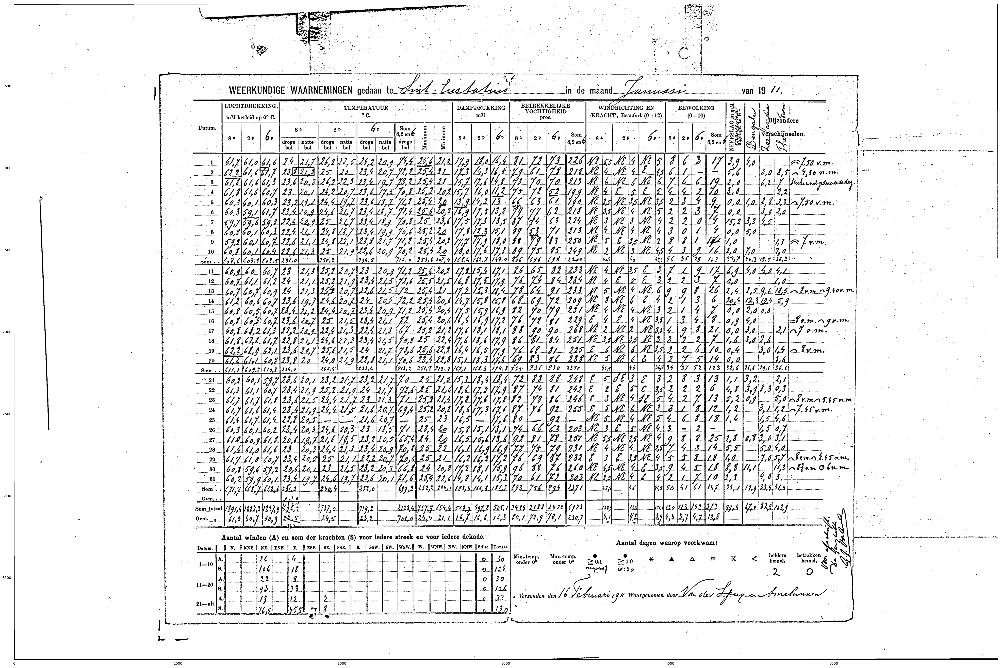

In [5]:
x = 1500
y = 1000
w = min_cell_width_threshold
h = min_cell_height_threshold
min = cv2.rectangle(binarized_image, (x, y), (x + w, y + h), (0, 0, 255), 3)

x = 1700
y = 1000
w = max_cell_width_threshold
h = max_cell_height_threshold
max = cv2.rectangle(binarized_image, (x, y), (x + w, y + h), (0, 255, 0), 3)
plt.figure(figsize=(50, 50))
plt.imshow(min, cmap='gray')
plt.axis('on')  # Hide axis
plt.show()

In [6]:
import logging
import pytesseract
import pandas as pd

logger = logging.getLogger('meteosaver')

def find_word(image: np.ndarray):
    """
    Return x, y of reference word "DATUM" in image
    """    
    word = 'DATUM.'
    offset = 400
    cropped = image[offset:1000, offset:1500]
    # plt.imshow(cropped, cmap='gray')
    data = pytesseract.image_to_data(cropped, lang='nld', 
                                     output_type=pytesseract.Output.DICT)

    # Convert the data to a DataFrame for easier manipulation
    df = pd.DataFrame(data)
    x = None
    # Find the word and get its coordinates
    for i in range(len(df['text'])):
        if df['text'][i].lower() == word.lower():
            (x, y) = (df['left'][i]+offset, df['top'][i]+offset)
            print(f"The word '{word}' was found at coordinates: "\
                  f"(x={x}, y={y})")
    if x is not None:
        return x, y, df
    else:
        return None, None, df
    
def table_detection(binarized_image: np.ndarray):
    """Returns the coordinates of the table in the image by finding the 
    word "DATUM" in the image and using default values for the table 
    width and height.

    Parameters
    ----------
    binarized_image
        
    Returns
    -------
        (x, y, w, h): Coordinates of top left corner of the table and 
        its width and height
    """    
    (x, y, df) = find_word(binarized_image)

    if x is None or y is None:
        logger.error("No table detected. Returning detected text.")
        return None, None, None, None, df
    w = 3663
    h = 2262+10
    # x, y = (x+150, y+170) 
    w = 3663
    h = 2601
    x, y = (x-40, y-150)

    return (x, y, w, h, df)

In [7]:
file_path = './data/00_knmi_images/072/st-eustatius_1911_0002.jpg'
img = read_img(file_path)
image_in_grayscale, binarized_image, original_image = image_preprocessing(img, blocksize=51)

# # plt.imshow(binarized_image,cmap='gray')

# cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
# cv2.imshow('custom window', binarized_image )
# cv2.resizeWindow('custom window', 1080, 920)
# cv2.waitKey()
# cv2.destroyAllWindows()

x, y, w, h, df = table_detection(binarized_image)

if x is not None:
    table_original_image = original_image[y:y + h, x:x + w]
    image_in_grayscale, binarized_image, original_image = image_preprocessing(table_original_image, cutoff_hsv=125, skew=False, blur=True, blocksize=101, C=5)
    
    table_img_bin = binarized_image
    table_original_image = original_image
    full_detected_table_with_labels = binarized_image
else:
    df.head()

# plt.imshow(table_img_bin, cmap='gray')
cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
cv2.imshow('custom window', table_img_bin)
cv2.resizeWindow('custom window', 1080, 920)
cv2.waitKey()
cv2.destroyAllWindows()

cv2.imwrite('st-eustatius_1911_0002_binarized.jpg', table_img_bin)
cv2.imwrite('st-eustatius_1911_0002_original.jpg', table_original_image)
cv2.imwrite('st-eustatius_1911_0002_grayscale.jpg', image_in_grayscale)

Rotating image by 0.13 degrees
The word 'DATUM.' was found at coordinates: (x=1125, y=744)


True

In [8]:
df

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,1,1,0,0,0,0,0,0,1100,600,-1,
1,2,1,1,0,0,0,912,105,188,46,-1,
2,3,1,1,1,0,0,912,105,188,46,-1,
3,4,1,1,1,1,0,912,105,188,46,-1,
4,5,1,1,1,1,1,912,105,188,46,37,WEERK!
5,2,1,2,0,0,0,824,198,276,51,-1,
6,3,1,2,1,0,0,824,198,276,51,-1,
7,4,1,2,1,1,0,824,198,276,51,-1,
8,5,1,2,1,1,1,824,199,15,1,76,_
9,5,1,2,1,1,2,883,198,217,51,29,[LUCHTDRUK


In [9]:
station = '072'

# plt.imshow(table_img_bin, cmap='gray')
cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
cv2.imshow('custom window', binarized_image )
cv2.resizeWindow('custom window', 1080, 920)
cv2.waitKey()
cv2.destroyAllWindows()

In [10]:
from src.table_and_cell_detection_model import remove_vertical_lines
table_img_bin = remove_vertical_lines(table_img_bin)

# Save the binary image for use later in detecting text
save_dir = os.path.join(transient_transcription_output_dir, station)
os.makedirs(save_dir, exist_ok=True)  # Ensure the directory exists
save_path = os.path.join(save_dir, 'table_binarized.jpg')
cv2.imwrite(save_path, table_img_bin)

# Invert the binarized image of the table
img_bin = 255-table_img_bin
# Detect the vertical lines in the image
vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, np.array(table_img_bin).shape[1]//80)) # The '//50' divides the length of the array (table) by 50, likely to obtain a fraction of the length for the structuring element,
eroded_image = cv2.erode(img_bin, vertical_kernel, iterations=1)
vertical_lines = cv2.dilate(eroded_image, vertical_kernel, iterations=5)
# Detect the horizontal lines in the image
hor_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (np.array(table_img_bin).shape[1]//60, 1)) # The '//20' divides the width of the array (table) by 20, likely to obtain a fraction of the width for the structuring element.
eroded_image= cv2.erode(img_bin, hor_kernel, iterations=1)
horizontal_lines = cv2.dilate(eroded_image, hor_kernel, iterations=5)
# Blending the imaegs with the vertical lines and the horizontal lines 
combined_vertical_and_horizontal_lines = cv2.addWeighted(vertical_lines, 1, horizontal_lines, 1, 1)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
combined_image_dilated = cv2.dilate(combined_vertical_and_horizontal_lines, kernel, iterations=5)
# Remove the lines from the image (table)
image_without_lines = cv2.subtract(img_bin, combined_image_dilated)
# Remove smaller 'still-visible' lines through noise removal
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
image_without_lines_noise_removed = cv2.erode(image_without_lines, kernel, iterations=1)
image_without_lines_noise_removed = cv2.dilate(image_without_lines_noise_removed, kernel, iterations=1)


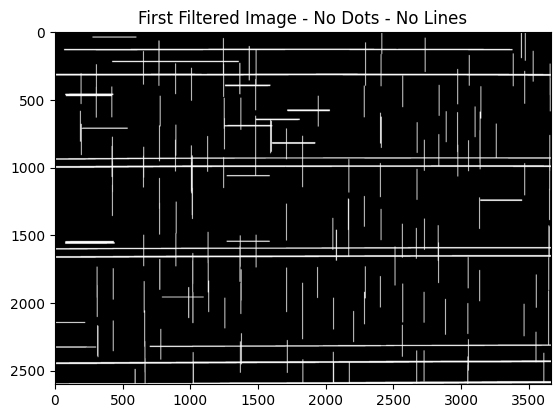

In [11]:

plt.imshow(combined_image_dilated, cmap="gray")
plt.title("First Filtered Image - No Dots - No Lines")
plt.show()

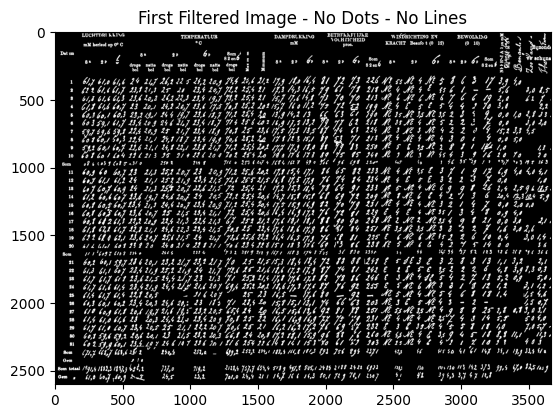

In [12]:
# Step 1: Detect all connected components
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(image_without_lines_noise_removed, connectivity=8)

# Create a mask to keep only valid text components
filtered_image = np.zeros_like(image_without_lines_noise_removed)

# Set thresholds
ASPECT_RATIO_THRESHOLD = 4  # If Width / Height > 4 (was 4 before this new check), it's considered horizontal noise
HEIGHT_THRESHOLD = 5  # Remove any blobs with height less than this
PROXIMITY_THRESHOLD = 5  # Maximum distance (in pixels) to consider a dot "close" to a number

# Store y-coordinates and x-limits of horizontal dots **ONLY NEAR TEXT**
horizontal_lines = []

logger.debug('Step 2: Identify large text components (potential numbers)')
text_components = []
dots_to_remove = np.zeros_like(labels)  # Mask for dots to be removed

for i in range(1, num_labels):
    x, y, w, h, area = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT], stats[i, cv2.CC_STAT_AREA]

    aspect_ratio = w / h  # Compute aspect ratio

    # Keep only real text (numbers) as reference components
    if area > 100 and aspect_ratio < ASPECT_RATIO_THRESHOLD and h > HEIGHT_THRESHOLD:   # was 100 before this check, then i tried 50
        text_components.append((x, y, w, h))
        filtered_image[labels == i] = 255  # Keep text
    
    else:
        dots_to_remove[labels == i] = 255  # Mark dots for removal

plt.imshow(filtered_image, cmap="gray")
plt.title("First Filtered Image - No Dots - No Lines")
plt.show()

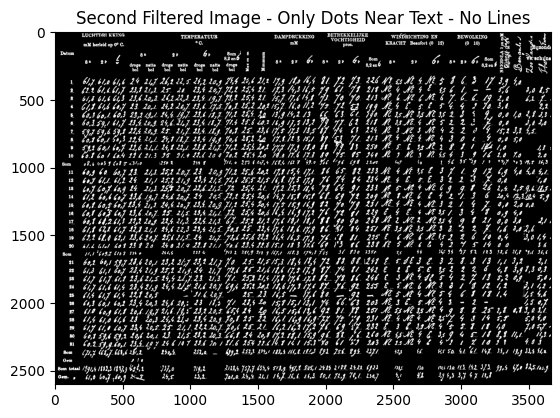

In [13]:

logger.debug('Step 3: Process small dots and keep only those near text')
for i in range(1, num_labels):
    x, y, w, h, area = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT], stats[i, cv2.CC_STAT_AREA]

    # Skip already kept text components
    if area > 100 and aspect_ratio < ASPECT_RATIO_THRESHOLD and h > HEIGHT_THRESHOLD:
        continue  # Skip large text components

    # Check if this small dot is close to any number
    keep_dot = False
    for tx, ty, tw, th in text_components:
        # Compute distance from dot center to the number bounding box
        dot_center_x, dot_center_y = x + w // 2, y + h // 2
        if (tx - PROXIMITY_THRESHOLD <= dot_center_x <= tx + tw + PROXIMITY_THRESHOLD and
            ty - PROXIMITY_THRESHOLD <= dot_center_y <= ty + th + PROXIMITY_THRESHOLD):
            keep_dot = True
            # Store the y-position and x-limits of dots near text
            horizontal_lines.append((dot_center_y, x, x + w))  # (y-position, x_start, x_end)
            break  # No need to check other numbers

    if keep_dot:
        filtered_image[labels == i] = 255  # Keep dots near numbers
    # else:
    #     dots_to_remove[labels == i] = 255  # Mark dots for removal

plt.imshow(filtered_image, cmap="gray")
plt.title("Second Filtered Image - Only Dots Near Text - No Lines")
plt.show()

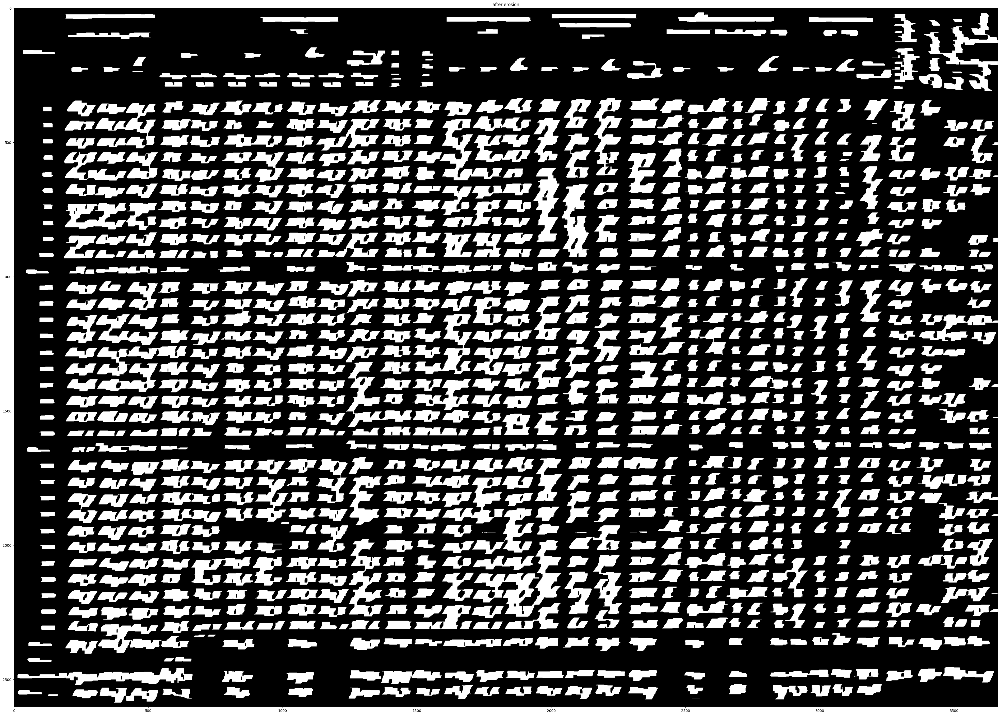

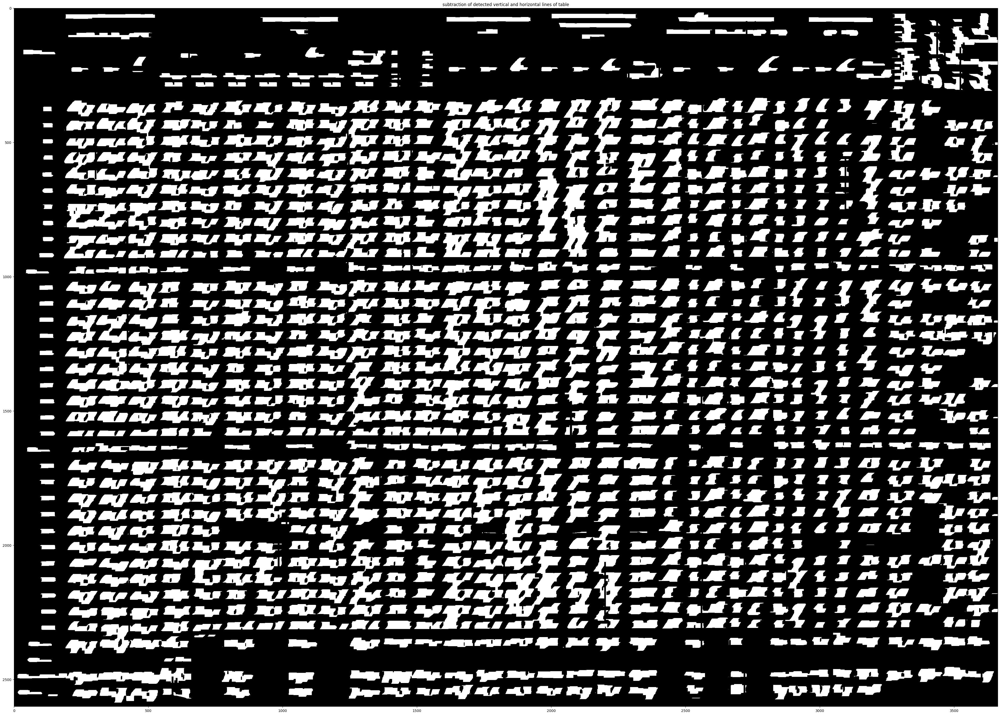

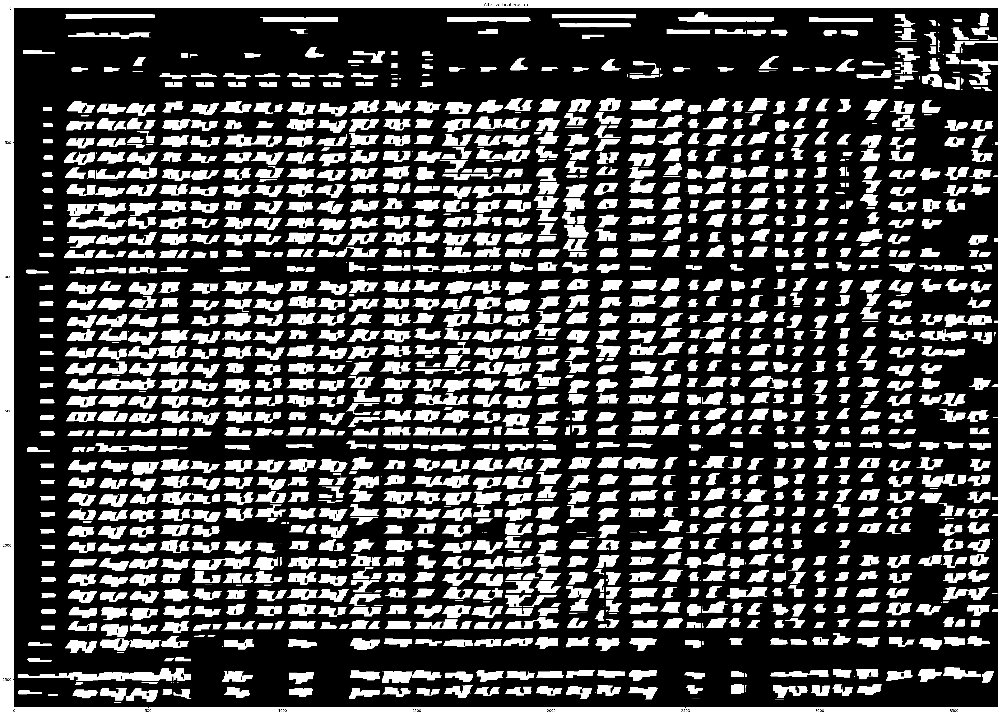

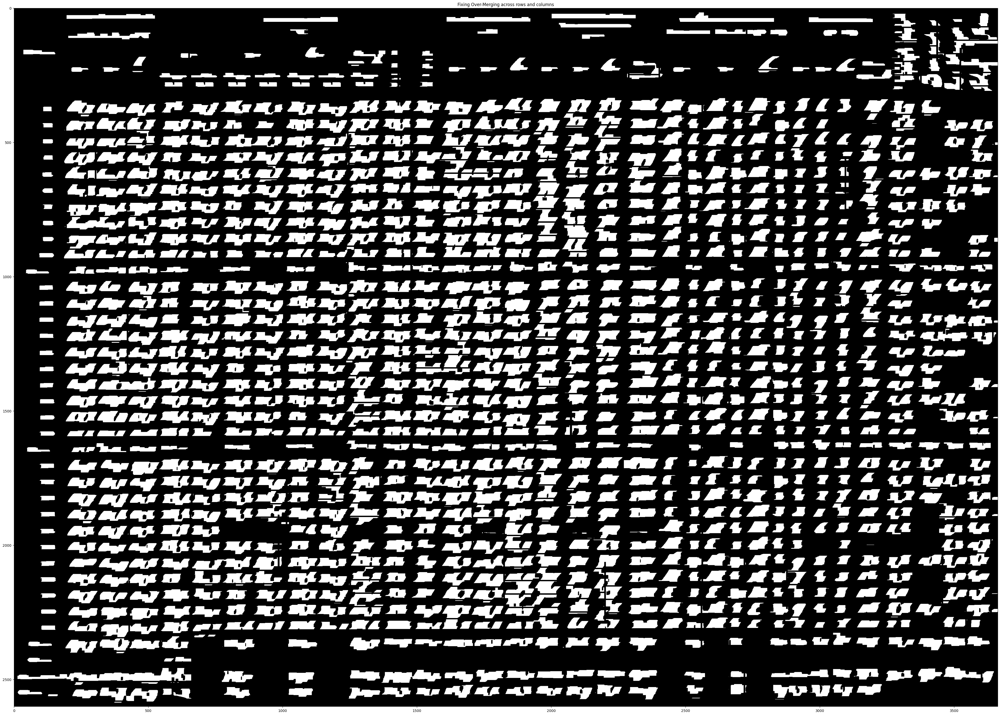

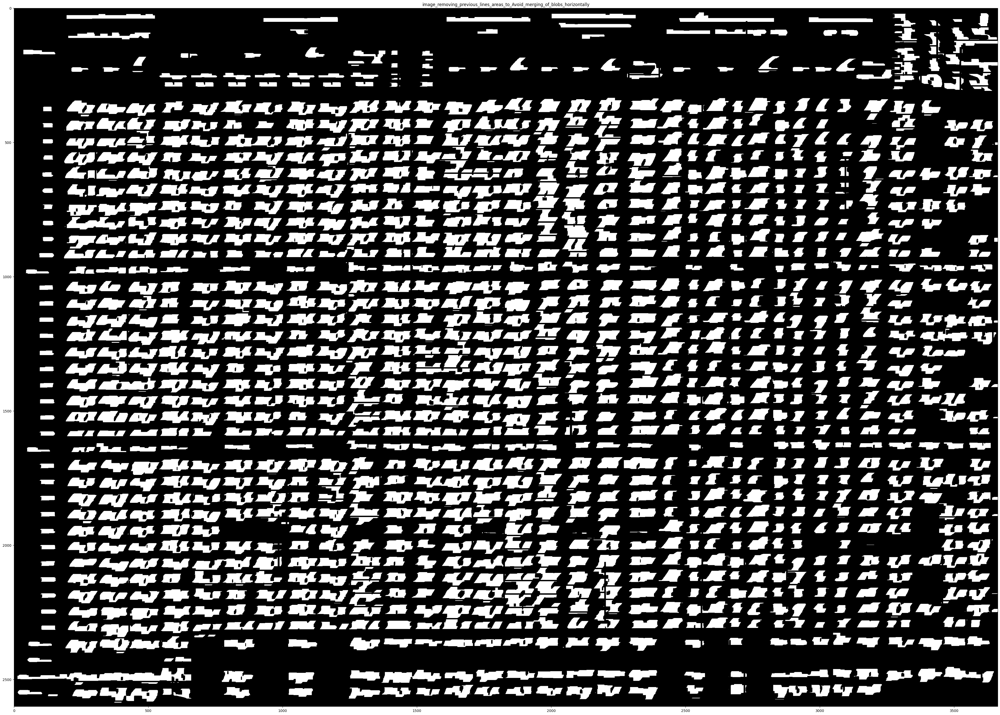

TypeError: 'numpy.ndarray' object is not callable

In [14]:
config.read('configuration.ini')
min_cell_width_threshold = int(config['TableAndCellDetection']['min_cell_width_threshold']) # Minimum cell width threshold for table and cell detection
max_cell_width_threshold = int(config['TableAndCellDetection']['max_cell_width_threshold']) # Maximum cell width threshold for table and cell detection
min_cell_height_threshold = int(config['TableAndCellDetection']['min_cell_height_threshold']) # Minimum cell height threshold for table and cell detection
max_cell_height_threshold = int(config['TableAndCellDetection']['max_cell_height_threshold']) # Maximum cell height threshold for


# Step 2: Use **horizontal dilation** to merge digits within numbers, but prevent full merging
kernel_to_remove_gaps = np.ones((1, 6), np.uint8)  # Horizontal merging kernel
image_with_number_blobs = cv2.dilate(filtered_image, kernel_to_remove_gaps, iterations=5)  # Controlled dilation



# Step 3: Apply **morphological closing** to ensure numbers remain compact blobs
rect_kernel = np.ones((1, 3), np.uint8)   # was 3 initially. in prev step was 1
image_with_word_blobs = cv2.morphologyEx(image_with_number_blobs, cv2.MORPH_CLOSE, rect_kernel, iterations=1)


# Define a horizontal erosion kernel
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 6))  # (height, width) to break horizontal merges. had it at 1,5 initially 
# Apply erosion to break the connection between digits
image_with_word_blobs = cv2.erode(image_with_word_blobs, horizontal_kernel, iterations=2)  # Increase iterations if still connected. Had 2 iteratons initially

plt.figure(figsize=(50,50))
plt.imshow(image_with_word_blobs, cmap = 'gray') # figure showing detected table image with horizintal and vertical lines removed.
plt.title('after erosion')
plt.show() 

# ** delete small horizontal lines.
# Create a blank mask for horizontal lines
# horizontal_line_mask = np.zeros_like(image_with_word_blobs)


# Draw **thin** horizontal lines at detected y-positions (but not subtracting yet)
# for y, x_start, x_end in horizontal_lines:
#     cv2.line(horizontal_line_mask, (x_start - 15, y), (x_end + 15, y), 255, thickness=3)  # Initially very thin

# **Step 3: Subtract the dilated lines from the filtered image**
# image_with_word_blobs = cv2.subtract(image_with_word_blobs, horizontal_line_mask)




# Subtract the detected vertical and horizontal lines from the filtered image**
image_with_word_blobs = cv2.subtract(image_with_word_blobs, combined_image_dilated)

plt.figure(figsize=(50,50))
plt.imshow(image_with_word_blobs, cmap = 'gray') # figure showing detected table image with horizintal and vertical lines removed.
plt.title('subtraction of detected vertical and horizontal lines of table')
plt.show() 


# # Define a horizontal erosion kernel
# horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 6))  # (height, width) to break horizontal merges. had it at 1,5 initially 
# # Apply erosion to break the connection between digits

# # ** delete small horizontal lines.
# # Create a blank mask for horizontal lines
# horizontal_line_mask = np.zeros_like(image_with_word_blobs)

# # Draw **thin** horizontal lines at detected y-positions (but not subtracting yet)
# for y, x_start, x_end in horizontal_lines:
#     cv2.line(horizontal_line_mask, (x_start - 15, y), (x_end + 15, y), 255, thickness=3)  # Initially very thin


# **Step 2: Find Wide Blobs That Need Stronger Erosion**
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(image_with_word_blobs, connectivity=8)

for i in range(1, num_labels):  # Ignore background (label 0)
    x, y, w, h = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]
    
    
    if h > max_cell_height_threshold: # ** If the blob is too tall, apply stronger erosion along the horizontal dimension**
        # erosion_kernel_vert = np.ones((min(h // 15, 12), 6), np.uint8)  # Adaptive vertical erosion # Initially had this: np.ones((min(h // 20, 12), 3), np.uint8)
        # erosion_kernel_vert = np.ones((1, 13), np.uint8)  # Slightly stronger erosion for wide blobs # Imitially had (10,3), BUT (1,10) improved it
        # roi = image_with_word_blobs[y:y+h, x:x+w]
        # eroded_roi = cv2.erode(roi, erosion_kernel_vert, iterations=3)  
        
        # # **Restore horizontal thickness**
        # dilation_kernel_vert = np.ones((1, 6), np.uint8)  # initially had (1,6)
        # recovered_roi = cv2.dilate(eroded_roi, dilation_kernel_vert, iterations=3)  

        # image_with_word_blobs[y:y+h, x:x+w] = recovered_roi 

        roi = image_with_word_blobs[y:y+h, x:x+w].copy()
        sliced_roi = roi.copy()

        # Determine how many rows this blob spans
        row_height = max_cell_height_threshold  # Approximate average row height in your dataset
        num_slices = h // row_height

        # Insert horizontal black lines to slice between rows
        for s in range(1, num_slices + 1):
            y_line = s * row_height
            if y_line < h:
                cv2.line(sliced_roi, (0, y_line), (w, y_line), 0, thickness=3)
                # print('Slided one blob horizontally') # Just a check to know how many wrongfully joined blobs in the same column and adjascent rows were sliced

        # Replace original ROI with sliced version
        image_with_word_blobs[y:y+h, x:x+w] = sliced_roi

plt.figure(figsize=(50,50))
plt.imshow(image_with_word_blobs, cmap="gray")
plt.title("After vertical erosion")
plt.show()

num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(image_with_word_blobs, connectivity=8)
for i in range(1, num_labels):  # Ignore background (label 0)
    x, y, w, h = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]
    if w > max_cell_width_threshold:  # **If the blob is too wide, apply stronger erosion**
        erosion_kernel = np.ones((2, 2), np.uint8)  # Slightly stronger erosion for wide blobs
        roi = image_with_word_blobs[y:y+h, x:x+w]
        eroded_roi = cv2.erode(roi, erosion_kernel, iterations=3)  # More iterations for wider blobs'
        
        # **Apply vertical recovery dilation to restore eroded thickness**
        dilation_kernel = np.ones((2, 1), np.uint8)  # Small dilation to restore height
        recovered_roi = cv2.dilate(eroded_roi, dilation_kernel, iterations=3)  # Restore vertical thickness
        
        image_with_word_blobs[y:y+h, x:x+w] = recovered_roi  # Replace only this region


plt.figure(figsize=(50,50))
plt.imshow(image_with_word_blobs, cmap="gray")
plt.title("Fixing Over-Merging across rows and columns")
plt.show()

# # One more step with **horizontal dilation** to merge digits within numbers, but prevent full merging
# kernel_to_remove_gaps = np.ones((1, 10), np.uint8)  # Horizontal merging kernel
# image_with_number_blobs = cv2.dilate(filtered_image, kernel_to_remove_gaps, iterations=5)  # Controlled dilation
# plt.imshow(image_with_word_blobs, cmap="gray")
# plt.title("Last horizontal dilations to completey merge digits of numbers in one cell")
# plt.show()



# Remove the lines from the image (table)
image_with_word_blobs = cv2.subtract(image_with_word_blobs, combined_image_dilated)

plt.figure(figsize=(50,50))
plt.imshow(image_with_word_blobs, cmap="gray")
plt.title("image_removing_previous_lines_areas_to_Avoid_merging_of_blobs_horizontally")
plt.show()

# # One more step to totally avoid joining cells in adjascent rows
# # **Step 2: Find Wide Blobs That Need Stronger Erosion**
# num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(image_with_word_blobs, connectivity=8)

# for i in range(1, num_labels):  # Ignore background (label 0)
#     x, y, w, h = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]
    
#     if h > 70: # ** If the blob is too tall, apply stronger erosion along the horizontal dimension**
#             # erosion_kernel_vert = np.ones((min(h // 15, 12), 6), np.uint8)  # Adaptive vertical erosion # Initially had this: np.ones((min(h // 20, 12), 3), np.uint8)
#             erosion_kernel_vert = np.ones((1, 10), np.uint8)  # Slightly stronger erosion for wide blobs # Imitially had (10,3), BUT (1,10) improved it
#             roi = image_with_word_blobs[y:y+h, x:x+w]
#             eroded_roi = cv2.erode(roi, erosion_kernel_vert, iterations=3)  
            
#             # # **Restore horizontal thickness**
#             # dilation_kernel_vert = np.ones((1, 6), np.uint8)  # initially had (1,6)
#             # recovered_roi = cv2.dilate(eroded_roi, dilation_kernel_vert, iterations=3)  

#             image_with_word_blobs[y:y+h, x:x+w] = eroded_roi

# plt.imshow(image_with_word_blobs, cmap="gray")
# plt.title("h>70 blobs eroded even more ")
# plt.show()

            

## Using contours in order to detect text in the table after removing the vertical and horizontal lines
# Assuming 'table' is your input image in BGR format
# result = cv2.findContours(image_without_lines_2, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
result = cv2.findContours(image_with_word_blobs, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours = result[0]
# Original image of table in binarizesd format
image_with_all_bounding_boxes = cv2.imread(save_path)
table_binarized = image_with_all_bounding_boxes.copy()



## FOR VISUALIZATION PURPOSES. Uncomment the lines below to plot the identified cells (contours/bounding boxes)
# Make a copy of the original image to overlay contours without modifying the original
table_img_bin_overlayed_with_contours = table_img_bin.copy()
# Convert the grayscale image to RGB to support colored bounding boxes
table_img_bin_overlayed_with_contours = cv2.cvtColor(table_img_bin_overlayed_with_contours, cv2.COLOR_GRAY2RGB)

from src.table_and_cell_detection_model import filter_contours

# Filter out smaller or larger bounding boxes from all the detected text contours. This is helpful to avoid overly large cells or small cells with no text. Remember to adjust these values based on the table structure in your specific case 
filtered_contours = filter_contours(contours, min_cell_width_threshold, min_cell_height_threshold, max_cell_width_threshold, max_cell_height_threshold)

# Iterate over each contour in the new_contours list and draw bounding boxes
for contour in filtered_contours:
    if contour is not None and len(contour) > 0:
        x, y, w, h = cv2.boundingRect(contour)

        # # Adjust bounding box dimensions
        # increase_factor_width = 0.05
        # increase_factor_height = 0.25
        # x += int(w * increase_factor_width) # Increase width
        # y -= int(h * increase_factor_height) # Increase height
        # w -= int(w * increase_factor_width) # Decrease width a little to avoid vertical lines that may be transcribed as the number 1 yet they aren't a number
        # h += int(h * increase_factor_height * 2) # Increase height

        # Define increase factors for bounding box modification
        increase_factor_width = 0.07  # Increase width by 7%
        increase_factor_height = 0.20  # Increase height by 20%

        # Expand width while keeping it centered
        new_w = int(w * (1 + increase_factor_width))  # Increase width
        x = max(0, x - (new_w - w) // 2)  # Adjust x to keep center fixed

        # Expand height symmetrically
        new_h = int(h * (1 + increase_factor_height * 2))  # Increase height
        y = max(0, y - (new_h - h) // 2)  # Adjust y to keep center fixed

        # Ensure bounding box remains within valid image bounds
        x = max(0, x)
        y = max(0, y)
        w = max(1, new_w)  # Avoid zero or negative width
        h = max(1, new_h)  # Avoid zero or negative height
        
        # Draw the bounding box directly on the overlay image
        cv2.rectangle(table_img_bin_overlayed_with_contours, (x, y), (x + w, y + h), (0, 0, 255), 3)

# Display the image with bounding boxes using matplotlib
plt.figure(figsize=(50, 50))
plt.imshow(table_img_bin_overlayed_with_contours)
plt.axis('off')  # Hide axis
plt.show()

# Sort contours by y-coordinate
contours_sorted = sorted(filtered_contours, key=lambda c: cv2.boundingRect(c)[1])

# Get the dimensions of the loaded image. Here, particulary the image/table width is very important for the column placement of cells/bounding boxes
image_height, image_width, image_channels = image_with_all_bounding_boxes.shape


# # Adding missing bounding boxes. Here, we define the minimum height space and minimum width space between the bounding boxes in a column and row respectively, in case of a missing bounding box.
# # Add missing ROIs to the contours
# new_contours = add_missing_rois(contours_sorted, space_height_threshold, space_width_threshold, max_cell_height_per_box, no_of_rows, no_of_columns, image_width)




# Apply the same dot removal to the **binarized image**
table_img_bin[dots_to_remove == 255] = 255  # Set dots to white

# Ensure the image is strictly binary
table_img_bin[table_img_bin > 127] = 255  # Set everything above 127 to white
table_img_bin[table_img_bin <= 127] = 0   # Set everything below 127 to black


# Save the binary image for use later in detecting text
save_dir = os.path.join(transient_transcription_output_dir, station)
os.makedirs(save_dir, exist_ok=True)  # Ensure the directory exists
save_path_without_dots = os.path.join(save_dir, 'table_binarized_without_dots.jpg')
cv2.imwrite(save_path_without_dots, table_img_bin)

# Original image of table in binarizesd format without the dots
table_binarized_without_dots_file = cv2.imread(save_path_without_dots)
table_binarized_without_dots = table_binarized_without_dots_file.copy()



# plt.imshow(table_binarized_without_dots)
# plt.title("Filtered Image - Text Only - Without dots")
# plt.show()



# detected_table_cells = [new_contours, image_with_all_bounding_boxes, table_binarized_without_dots, table_original_image, full_detected_table_with_labels]

# detected_table_cells = [contours_sorted, image_with_all_bounding_boxes, table_binarized_without_dots, table_original_image, full_detected_table_with_labels]

table_for_overlaying_with_contours = table_img_bin.copy()
# Convert the grayscale image to RGB to support colored bounding boxes
table_for_overlaying_with_contours = cv2.cvtColor(table_for_overlaying_with_contours, cv2.COLOR_GRAY2RGB)
detected_table_cells = [contours_sorted, image_with_all_bounding_boxes, table_for_overlaying_with_contours, table_original_image, full_detected_table_with_labels]


In [132]:
max_cell_height_threshold

80

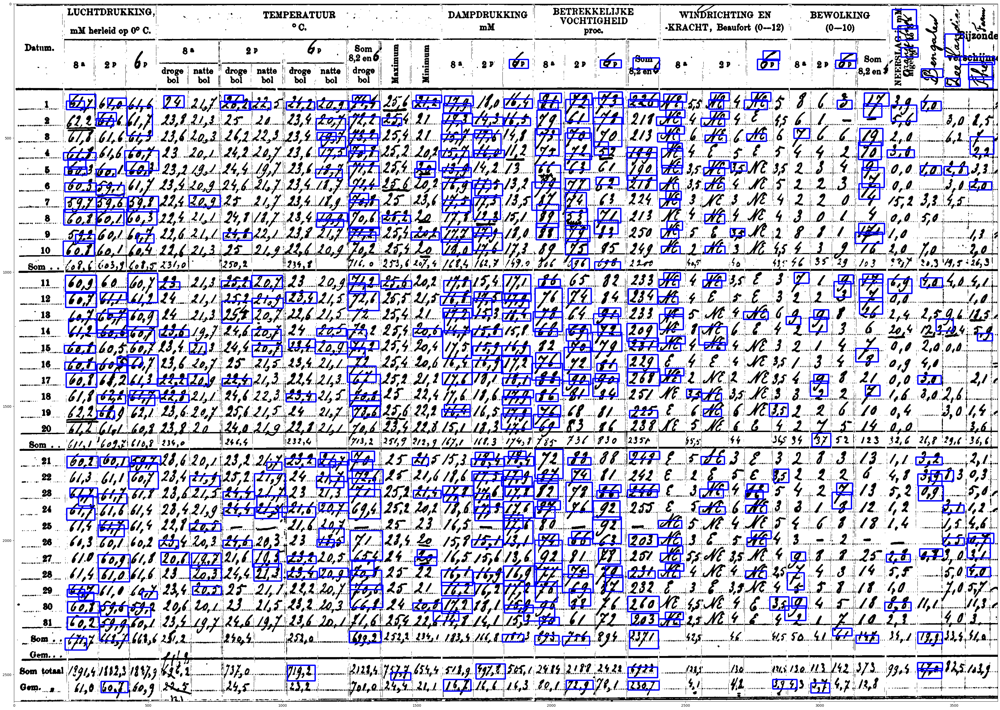

In [118]:
plt.figure(figsize=(50, 50))
plt.imshow(table_img_bin_overlayed_with_contours, cmap="gray")
plt.axis('on')
plt.show()

In [ ]:

cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
cv2.imshow('custom window', table_img_bin_overlayed_with_contours)
cv2.resizeWindow('custom window', 1080, 920)
cv2.waitKey()
cv2.destroyAllWindows()

In [40]:
logger.debug('**Step 2: Find Wide Blobs That Need Stronger Erosion**')
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(image_with_word_blobs, connectivity=8)

for i in range(1, num_labels):  # Ignore background (label 0)
    x, y, w, h = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]
    
    if w > 200:  # **If the blob is too wide, apply stronger erosion**
        erosion_kernel = np.ones((3, 10), np.uint8)  # Slightly stronger erosion for wide blobs
        roi = image_with_word_blobs[y:y+h, x:x+w]
        eroded_roi = cv2.erode(roi, erosion_kernel, iterations=3)  # More iterations for wider blobs'
        
        # **Apply vertical recovery dilation to restore eroded thickness**
        dilation_kernel = np.ones((2, 1), np.uint8)  # Small dilation to restore height
        recovered_roi = cv2.dilate(eroded_roi, dilation_kernel, iterations=3)  # Restore vertical thickness
        
        image_with_word_blobs[y:y+h, x:x+w] = recovered_roi  # Replace only this region
    
    if h > 50: # ** If the blob is too tall, apply stronger erosion along the horizontal dimension**
        # erosion_kernel_vert = np.ones((min(h // 15, 12), 6), np.uint8)  # Adaptive vertical erosion # Initially had this: np.ones((min(h // 20, 12), 3), np.uint8)
        erosion_kernel_vert = np.ones((1, 13), np.uint8)  # Slightly stronger erosion for wide blobs # Imitially had (10,3), BUT (1,10) improved it
        roi = image_with_word_blobs[y:y+h, x:x+w]
        eroded_roi = cv2.erode(roi, erosion_kernel_vert, iterations=3)  
        
        # **Restore horizontal thickness**
        dilation_kernel_vert = np.ones((1, 6), np.uint8)  # initially had (1,6)
        recovered_roi = cv2.dilate(eroded_roi, dilation_kernel_vert, iterations=3)  

        image_with_word_blobs[y:y+h, x:x+w] = recovered_roi 

# plt.imshow(image_with_word_blobs, cmap="gray")
# plt.title("After Adaptive Erosion (Fixing Over-Merging)")
# plt.show()

In [41]:
## Using contours in order to detect text in the table after removing the vertical and horizontal lines
# Assuming 'table' is your input image in BGR format
# result = cv2.findContours(image_without_lines_2, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
result = cv2.findContours(image_with_word_blobs, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours = result[0]
# Original image of table in binarizesd format
image_with_all_bounding_boxes = cv2.imread(save_path)
# table_binarized = image_with_all_bounding_boxes.copy()

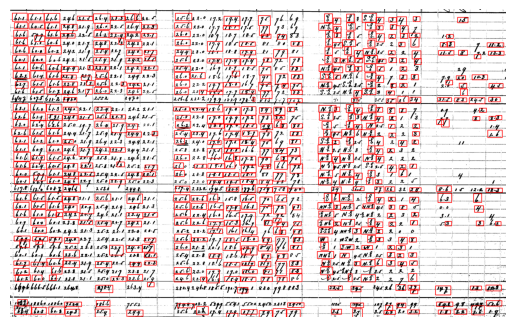

In [118]:
from src.table_and_cell_detection_model import filter_contours
min_cell_width_threshold=int(config['TableAndCellDetection']['min_cell_width_threshold'])
max_cell_width_threshold=int(config['TableAndCellDetection']['max_cell_width_threshold'])
min_cell_height_threshold=int(config['TableAndCellDetection']['min_cell_height_threshold'])
max_cell_height_threshold=int(config['TableAndCellDetection']['max_cell_height_threshold'])

## FOR VISUALIZATION PURPOSES. Uncomment the lines below to plot the identified cells (contours/bounding boxes)
# Make a copy of the original image to overlay contours without modifying the original
table_img_bin_overlayed_with_contours = table_img_bin.copy()
# Convert the grayscale image to RGB to support colored bounding boxes
table_img_bin_overlayed_with_contours = cv2.cvtColor(table_img_bin_overlayed_with_contours, cv2.COLOR_GRAY2RGB)

# Filter out smaller or larger bounding boxes from all the detected text contours. This is helpful to avoid overly large cells or small cells with no text. Remember to adjust these values based on the table structure in your specific case 
filtered_contours = filter_contours(contours, min_cell_width_threshold, min_cell_height_threshold, max_cell_width_threshold, max_cell_height_threshold)

logger.debug('Iterate over each contour in the new_contours list and draw bounding boxes')
for contour in filtered_contours:
    if contour is not None and len(contour) > 0:
        x, y, w, h = cv2.boundingRect(contour)

        # # Adjust bounding box dimensions
        # increase_factor_width = 0.05
        # increase_factor_height = 0.25
        # x += int(w * increase_factor_width) # Increase width
        # y -= int(h * increase_factor_height) # Increase height
        # w -= int(w * increase_factor_width) # Decrease width a little to avoid vertical lines that may be transcribed as the number 1 yet they aren't a number
        # h += int(h * increase_factor_height * 2) # Increase height

        # Define increase factors for bounding box modification
        increase_factor_width = 0.07  # Increase width by 20%
        increase_factor_height = 0.25  # Increase height by 25%

        # Expand width while keeping it centered
        new_w = int(w * (1 + increase_factor_width))  # Increase width
        x = max(0, x - (new_w - w) // 2)  # Adjust x to keep center fixed

        # Expand height symmetrically
        new_h = int(h * (1 + increase_factor_height * 2))  # Increase height
        y = max(0, y - (new_h - h) // 2)  # Adjust y to keep center fixed

        # Ensure bounding box remains within valid image bounds
        x = max(0, x)
        y = max(0, y)
        w = max(1, new_w)  # Avoid zero or negative width
        h = max(1, new_h)  # Avoid zero or negative height
        
        # Draw the bounding box directly on the overlay image
        cv2.rectangle(table_img_bin_overlayed_with_contours, (x, y), (x + w, y + h), (255, 0, 0), 3)

# # Display the image with bounding boxes using matplotlib
plt.imshow(table_img_bin_overlayed_with_contours)
plt.axis('off')  # Hide axis
plt.show()

In [119]:
from src.table_and_cell_detection_model import group_contours_into_columns
from sklearn.cluster import KMeans

def add_missing_rois(sorted_contours, space_threshold, space_width_threshold, max_cell_height_per_box, max_rows, num_columns, image_width):
    '''
    Improved function to add missing ROIs **only where they align with existing rows in at least two neighboring columns**.
    '''
    NEW_CELL_HEIGHT = 40
    NEW_CELL_WIDTH = 100
    # ✅ Step 1: Group contours into columns
    columns = group_contours_into_columns(sorted_contours, num_columns, image_width)

    # ✅ Collect all row centers across all columns
    all_row_centers = []
    for i in sorted(columns.keys()):
        column_boxes = sorted(columns[i], key=lambda b: b[1])  # Sort by y-coordinate
        all_row_centers.extend([box[1] + box[3] // 2 for box in column_boxes])

    # ✅ Step 2: Apply KMeans for row clustering
    if len(all_row_centers) > 1:
        num_clusters = min(max_rows, len(all_row_centers))  # Ensure at least 1 cluster
        kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
        kmeans.fit(np.array(all_row_centers).reshape(-1, 1))
        global_row_centroids = sorted(kmeans.cluster_centers_.flatten())
    else:
        global_row_centroids = np.linspace(0, max(all_row_centers), max_rows)  # Default spacing

    print(f'[DEBUG] Global estimated row centroids = {global_row_centroids}')

    new_boxes = []

    # ✅ Step 3: Process each column
    for i in sorted(columns.keys()):  # Process columns in order
        added_boxes = []
        column_boxes = sorted(columns[i], key=lambda b: b[1])  # Sort by y-coordinate
        column_count = len(column_boxes)
        print(f'[DEBUG] Column {i}: {column_count} detected rows.')

        # ✅ Identify gaps between detected cells
        gaps = []
        for j in range(1, len(column_boxes)):
            prev_box = column_boxes[j - 1]
            curr_box = column_boxes[j]
            space_between = curr_box[1] - (prev_box[1] + prev_box[3])
            if space_between > space_threshold:
                print(curr_box, prev_box)
                print(space_between, space_height_threshold)
                gaps.append((space_between, prev_box, curr_box))
        print(f'[DEBUG] Column {i} gaps: {len(gaps)}')
        # ✅ Sort gaps from largest to smallest
        gaps.sort(key=lambda x: x[0], reverse=True)

        # ✅ Step 4: Add missing boxes **only where they align with neighboring columns**
        missing_count = max_rows - column_count
        for gap in gaps:
            if column_count >= max_rows or missing_count <= 0:
                break  # Stop if we exceed max_rows

            space_between, prev_box, curr_box = gap
            new_y = prev_box[1] + prev_box[3] + (space_between - max_cell_height_per_box) // 2

            # Adaptive expansion of the box width
            expansion_factor = 1.2  # Increase width by 20% to ensure text coverage
            new_x = prev_box[0] - ((expansion_factor - 1) * space_width_threshold) // 2
            new_width = int(space_width_threshold * expansion_factor)
            new_box = (new_x, new_y, NEW_CELL_WIDTH, NEW_CELL_HEIGHT)

            # ✅ Find how many existing boxes in **neighboring columns** align with `new_y`
            aligned_boxes = []
            if i > 0:  # Check previous column
                aligned_boxes += [box for box in columns.get(i - 1, []) if abs((box[1] + box[3] // 2) - (new_y + max_cell_height_per_box // 2)) < 15]
            if i < num_columns - 1:  # Check next column
                aligned_boxes += [box for box in columns.get(i + 1, []) if abs((box[1] + box[3] // 2) - (new_y + max_cell_height_per_box // 2)) < 15]

            # ✅ Make sure the new box aligns with at least **two** neighbors
            if len(aligned_boxes) >= 2:
                print(f'[DEBUG] Adding missing box at: {new_box} (aligned with 2+ neighboring columns)')
                added_boxes.append(new_box)
                column_count += 1
                missing_count -= 1
            elif any(abs(centroid - (new_y + max_cell_height_per_box // 2)) < 20 for centroid in global_row_centroids):  # tried with 15 initially
                print(f'[DEBUG] Adding missing box at: {new_box} (aligned with row centroid)')
                added_boxes.append(new_box)
                column_count += 1
                missing_count -= 1

        # ✅ Re-sort column after adding missing boxes
        added_boxes = sorted(added_boxes, key=lambda b: b[1])
        new_boxes.extend(added_boxes)

    # ✅ Convert bounding boxes into OpenCV contours
    new_contours = [np.array([
        [box[0], box[1]], [box[0] + box[2], box[1]], 
        [box[0] + box[2], box[1] + box[3]], [box[0], box[1] + box[3]]
    ], dtype=np.int32) for box in new_boxes]

    return new_contours

In [120]:
# from src.table_and_cell_detection_model import add_missing_rois

# Sort contours by y-coordinate
contours_sorted = sorted(filtered_contours, key=lambda c: cv2.boundingRect(c)[1])

# Get the dimensions of the loaded image. Here, particulary the image/table width is very important for the column placement of cells/bounding boxes
image_height, image_width, image_channels = image_with_all_bounding_boxes.shape

config.read('configuration.ini')

space_height_threshold=int(config['TableAndCellDetection']['space_height_threshold'])
space_width_threshold=int(config['TableAndCellDetection']['space_width_threshold'])
max_cell_height_per_box=int(config['TableAndCellDetection']['max_cell_height_per_box'])
no_of_rows=int(config['TableAndCellDetection']['no_of_rows'])
no_of_columns=int(config['TableAndCellDetection']['no_of_columns'])
            
# Adding missing bounding boxes. Here, we define the minimum height space and minimum width space between the bounding boxes in a column and row respectively, in case of a missing bounding box.
# Add missing ROIs to the contours
new_contours = add_missing_rois(contours_sorted, space_height_threshold, space_width_threshold, max_cell_height_per_box, no_of_rows, no_of_columns, image_width)


## FOR VISUALIZATION PURPOSES. Uncomment the lines below to plot the identified cells (contours/bounding boxes)
# Make a copy of the original image to overlay contours without modifying the original
# table_img_bin_overlayed_with_contours = table_img_bin.copy()
new_contours_img = table_img_bin_overlayed_with_contours.copy()
# Convert the grayscale image to RGB to support colored bounding boxes
# table_img_bin_overlayed_with_contours = cv2.cvtColor(table_img_bin_overlayed_with_contours, cv2.COLOR_GRAY2RGB)


# Iterate over each contour in the new_contours list and draw bounding boxes
for contour in new_contours:
    if contour is not None and len(contour) > 0:
        x, y, w, h = cv2.boundingRect(contour)

        # Adjust bounding box dimensions
        increase_factor_width = 0.2
        increase_factor_height = 0.3
        # x += int(w * increase_factor_width) # Increase width
        # y -= int(h * increase_factor_height) # Increase height
        # w -= int(w * increase_factor_width) # Decrease width a little to avoid vertical lines that may be transcribed as the number 1 yet they aren't a number
        # h += int(h * increase_factor_height * 2) # Increase height

        # Expand width
        new_w = int(w * (1 + increase_factor_width))  # Increase width
        x = x - (new_w - w) // 2  # Center the new width

        # Expand height
        new_h = int(h * (1 + increase_factor_height * 2))  # Increase height on both sides
        y = y - (new_h - h) // 2  # Center the new height
        
        # # Draw the bounding box directly on the overlay image
        # cv2.rectangle(table_img_bin_overlayed_with_contours, (x, y), (x + w, y + h), (0, 255, 0), 4)

        # Draw the updated bounding box
        cv2.rectangle(new_contours_img, (x, y), (x + new_w, y + new_h), (0, 0, 255), 3)

# Remove contours that are None or empty
new_contours = [contour for contour in new_contours if contour is not None and len(contour) > 0]

# Display the image with bounding boxes using matplotlib
# plt.imshow(table_img_bin_overlayed_with_contours)
# plt.axis('off')  # Hide axis
# plt.show()
cv2.namedWindow('detected cells', cv2.WINDOW_KEEPRATIO)
cv2.imshow('detected cells', new_contours_img)
cv2.resizeWindow('detected cells', 1080, 920)
cv2.imwrite('detected_cells.jpg', new_contours_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

[DEBUG] Global estimated row centroids = [71.74999999999989, 133.4117647058821, 195.89999999999986, 255.05555555555554, 318.66666666666674, 377.1363636363636, 437.8888888888889, 498.19047619047615, 558.3333333333333, 611.0625, 670.7272727272727, 741.2727272727273, 801.4761904761905, 857.4090909090909, 920.6666666666667, 978.5625, 1044.4, 1102.6, 1160.0526315789473, 1219.25, 1268.8461538461538, 1330.0, 1396.2857142857142, 1460.7, 1515.5, 1577.608695652174, 1636.909090909091, 1702.6666666666665, 1760.7333333333331, 1816.7, 1878.736842105263, 1969.458333333333, 2061.181818181818, 2180.6, 2236.6315789473683]
[DEBUG] Column 0: 29 detected rows.
(26, 706, 104, 38) (42, 544, 89, 32)
130 40
(33, 1370, 112, 36) (34, 1248, 105, 35)
87 40
(33, 1680, 112, 25) (31, 1490, 106, 37)
153 40
(31, 1863, 107, 22) (73, 1710, 69, 38)
115 40
(59, 2150, 66, 33) (41, 1968, 106, 32)
150 40
[DEBUG] Column 0 gaps: 5
[DEBUG] Adding missing box at: (38.0, 2045, 100, 40) (aligned with row centroid)
[DEBUG] Adding mi

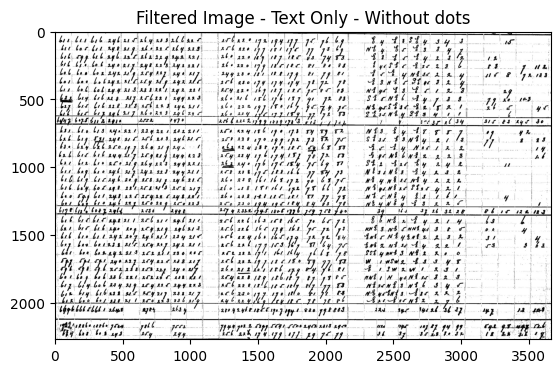

In [24]:

# Apply the same dot removal to the **binarized image**
table_img_bin[dots_to_remove == 255] = 255  # Set dots to white

# Ensure the image is strictly binary
table_img_bin[table_img_bin > 127] = 255  # Set everything above 127 to white
table_img_bin[table_img_bin <= 127] = 0   # Set everything below 127 to black


# Save the binary image for use later in detecting text
save_dir = os.path.join(transient_transcription_output_dir, station)
os.makedirs(save_dir, exist_ok=True)  # Ensure the directory exists
save_path_without_dots = os.path.join(save_dir, 'table_binarized_without_dots.jpg')
cv2.imwrite(save_path_without_dots, table_img_bin)

# Original image of table in binarizesd format without the dots
table_binarized_without_dots_file = cv2.imread(save_path_without_dots)
table_binarized_without_dots = table_binarized_without_dots_file.copy()



plt.imshow(table_binarized_without_dots)
plt.title("Filtered Image - Text Only - Without dots")
plt.show()

# detected_table_cells = [new_contours, image_with_all_bounding_boxes, table_binarized_without_dots, table_original_image, full_detected_table_with_labels]

detected_table_cells = [contours_sorted, image_with_all_bounding_boxes, table_binarized_without_dots, table_original_image, full_detected_table_with_labels]

In [122]:
detected_table_and_cells = detected_table_cells

pre_QA_QC_transcribed_hydroclimate_data_dir_station = os.path.join(pre_QA_QC_transcribed_hydroclimate_data_dir, station)
post_QA_QC_transcribed_hydroclimate_data_dir_station = os.path.join(post_QA_QC_transcribed_hydroclimate_data_dir, station)
month_filename = os.path.basename(file_path)

# Module 4: Transcription
start_time = datetime.now()
ocr_model = config['Transcription']['ocr_model'] # Selected OCR/HTR model
# Incase of Tesseract
# Ensure that the tesseract path is set correctly for your local system
tesseract_path = config['Transcription']['tesseract_path']
# Set TESSDATA_PREFIX to the system's tessdata directory (for system-wide language files)
system_tessdata_dir = config['Transcription']['system_tessdata_dir']
os.environ["TESSDATA_PREFIX"] = system_tessdata_dir
transcribed_table = transcription(detected_table_and_cells, ocr_model, tesseract_path, transient_transcription_output_dir, pre_QA_QC_transcribed_hydroclimate_data_dir_station, station, month_filename,
                                    no_of_rows=int(config['TableAndCellDetection']['no_of_rows']),
                                    no_of_columns=int(config['TableAndCellDetection']['no_of_columns']),
                                    no_of_rows_including_headers=int(config['TableAndCellDetection']['no_of_rows_including_headers']))

end_time = datetime.now()

print(f'Duration of transcribing: {end_time - start_time}')

0it [00:00, ?it/s]/home/teun/knmi/meteosaver/MeteoSaver/.venv/lib/python3.10/site-packages/torch/utils/data/dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
43it [02:24,  3.36s/it]
0it [00:00, ?it/s]/home/teun/knmi/meteosaver/MeteoSaver/.venv/lib/python3.10/site-packages/torch/utils/data/dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
43it [02:31,  3.52s/it]


Duration of transcribing: 0:05:01.227386


In [123]:
transcribed_table

'results/01_pre_QA_QC_transcribed_hydroclimate_data/072/072_191201_SF.jpg_pre_QA_QC.xlsx'

In [ ]:
# Module 5: Quality assessment and Quality Control
qa_qc_checked_data = qa_qc(transcribed_table, station, transient_transcription_output_dir, post_QA_QC_transcribed_hydroclimate_data_dir_station, month_filename,
                            max_temperature_threshold = float(config['QAQC']['max_temperature_threshold']),
                            min_temperature_threshold = float(config['QAQC']['min_temperature_threshold']),
                            decimal_places = int(config['QAQC']['decimal_places']),
                            uncertainty_margin = float(config['QAQC']['uncertainty_margin']),
                            header_rows = int(config['QAQC']['header_rows']),
                            multi_day_totals = config.getboolean('QAQC', 'multi_day_totals'),
                            multi_day_averages = config.getboolean('QAQC', 'multi_day_averages'),
                            max_days_for_multi_day_total = int(config['QAQC']['max_days_for_multi_day_total']),
                            multi_day_totals_rows = list(map(int, config['QAQC']['multi_day_totals_rows'].split(','))),
                            final_totals_rows = list(map(int, config['QAQC']['final_totals_rows'].split(','))),
                            excluded_rows = list(map(int, config['QAQC']['excluded_rows'].split(','))),
                            excluded_columns = list(map(int, config['QAQC']['excluded_columns'].split(','))),
                            columns_to_check = config['QAQC']['columns_to_check'].split(','),
                            columns_to_check_with_extra_variable = config['QAQC']['columns_to_check_with_extra_variable'].split(','))

2025-05-19 14:55:00,143 - ERROR - No table detected. Returning None.
2025-05-19 14:55:00,519 - ERROR - No table detected. Returning None.


Error processing 072_191212_SF.jpg: cannot unpack non-iterable NoneType object


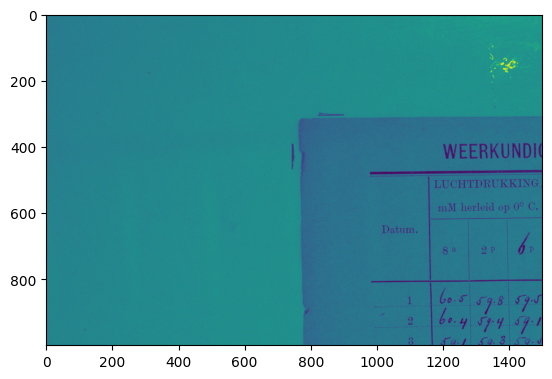

In [10]:
import matplotlib.pyplot as plt
# from src_knmi.table_detection import table_detection
station = '072'

datadir = os.path.join(full_datadir, station)
pre_QA_QC_transcribed_hydroclimate_data_dir_station = os.path.join(
    pre_QA_QC_transcribed_hydroclimate_data_dir, station)
post_QA_QC_transcribed_hydroclimate_data_dir_station = os.path.join(
    post_QA_QC_transcribed_hydroclimate_data_dir, station)

# Ensure directories exist
os.makedirs(pre_QA_QC_transcribed_hydroclimate_data_dir_station, 
            exist_ok=True)
os.makedirs(post_QA_QC_transcribed_hydroclimate_data_dir_station, 
            exist_ok=True)

# Search for all files in the `datadir` that start with the station 
# number followed by an underscore ('_') and any other characters, 
# and return a list of all matching file paths
station_data = glob.glob(os.path.join(datadir, f"{station}_*")) 
# OPTIONAL (Comment these two lines below if unnecessary): 
# Filter the station_data and filenames to include only files with 
# 'SF' in their names. Here the SF for standard format for sheets. 
# This to filter our sheets with HD in their name, which stands for 
# hand-drawn format, in their name as these were not standard 
# formatted sheets and manually drawn by the observer.
filenames = [os.path.basename(file) for file in station_data 
                if 'SF' in os.path.basename(file)]

for month in range(len(filenames)):
    month_data = station_data[month]
    month_filename = filenames[month]

    # Perform Pre-processing, Transcription, QA/QC, and Post-
    # processing
    try:
        # Module 2: Image pre-processing
        image_in_grayscale, binarized_image, original_image = image_preprocessing(
            month_data)
        coords = table_detection(image_in_grayscale)
        # Module 3: Table and cell detection 
        detected_table_and_cells = table_and_cell_detection(
            image_in_grayscale, binarized_image, original_image, 
            station, month_filename, 
            transient_transcription_output_dir,
            clip_up = int(config['TableAndCellDetection']['clip_up']), 
            clip_down = int(config['TableAndCellDetection']['clip_down']),
            clip_left = int(config['TableAndCellDetection']['clip_left']),
            clip_right = int(config['TableAndCellDetection']['clip_right']),
            max_table_width = int(config['TableAndCellDetection']['max_table_width']),
            max_table_height = int(config['TableAndCellDetection']['max_table_height']),
            min_cell_width_threshold=int(config['TableAndCellDetection']['min_cell_width_threshold']),
            max_cell_width_threshold=int(config['TableAndCellDetection']['max_cell_width_threshold']),
            min_cell_height_threshold=int(config['TableAndCellDetection']['min_cell_height_threshold']),
            max_cell_height_threshold=int(config['TableAndCellDetection']['max_cell_height_threshold']),
            space_height_threshold=int(config['TableAndCellDetection']['space_height_threshold']), 
            space_width_threshold=int(config['TableAndCellDetection']['space_width_threshold']), 
            max_cell_height_per_box=int(config['TableAndCellDetection']['max_cell_height_per_box']), 
            no_of_rows=int(config['TableAndCellDetection']['no_of_rows']), 
            no_of_columns=int(config['TableAndCellDetection']['no_of_columns']))
        break
    except Exception as e:
            print(f"Error processing {month_filename}: {e}")
            pass
    
    break

In [67]:
station = '203'
month_filename = '203_196905_SF'
transient_transcription_output_dir = config['Directories']['transient_transcription_output_dir'] # Directory to store transient transcription output during processing

In [68]:
preprocessed = image_preprocessing(
    #'data/00_post1960_DRC_hydroclimate_datasheet_images/203/203_196905_SF.JPG'
    '/home/teun/knmi/data-rescue-internship-teun/data/processed/st-eustatius/1912/st-eustatius_1912_0012.jpg'
    )
image_in_grayscale, binarized_image, original_image = preprocessed
detected_table_cells = table_and_cell_detection(
    image_in_grayscale, binarized_image, original_image, 
    station, month_filename, transient_transcription_output_dir,
    clip_up = int(config['TableAndCellDetection']['clip_up']), 
    clip_down = int(config['TableAndCellDetection']['clip_down']),
    clip_left = int(config['TableAndCellDetection']['clip_left']),
    clip_right = int(config['TableAndCellDetection']['clip_right']),
    max_table_width = int(config['TableAndCellDetection']['max_table_width']),
    max_table_height = int(config['TableAndCellDetection']['max_table_height']),
    min_cell_width_threshold=int(config['TableAndCellDetection']['min_cell_width_threshold']),
    max_cell_width_threshold=int(config['TableAndCellDetection']['max_cell_width_threshold']),
    min_cell_height_threshold=int(config['TableAndCellDetection']['min_cell_height_threshold']),
    max_cell_height_threshold=int(config['TableAndCellDetection']['max_cell_height_threshold']),
    space_height_threshold=int(config['TableAndCellDetection']['space_height_threshold']), 
    space_width_threshold=int(config['TableAndCellDetection']['space_width_threshold']), 
    max_cell_height_per_box=int(config['TableAndCellDetection']['max_cell_height_per_box']), 
    no_of_rows=int(config['TableAndCellDetection']['no_of_rows']), 
    no_of_columns=int(config['TableAndCellDetection']['no_of_columns']))
new_contours = detected_table_cells[0]
image_with_all_bounding_boxes = detected_table_cells[1]
table_copy = detected_table_cells[2]

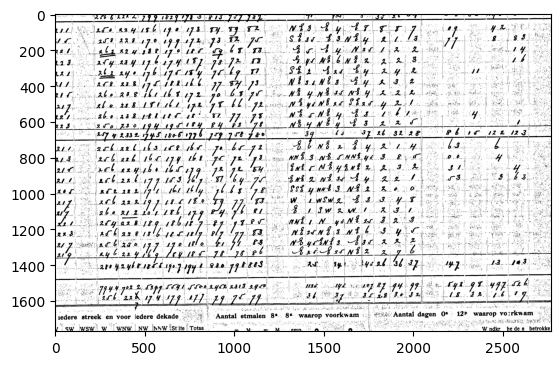

In [62]:
plt.imshow(detected_table_cells[2])

In [29]:
# Load the image
image = cv2.imread('st-eustatius_1912_0002.jpg')

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply a binary threshold to get a binary image
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
imS = cv2.resize(binary, (1500, 800))
cv2.imshow('Binary Image', imS)

# Find contours
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Find the largest contour which should be the paper
contours_sorted = sorted(contours, key=cv2.contourArea, reverse=True)

# Draw the contour on the original image
cv2.drawContours(image, contours_sorted[0], -1, (0, 255, 0), 2)
 
# Display the result
imS = cv2.resize(image, (1500, 800))
cv2.imshow('Detected Boundary', imS)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [41]:
import numpy as np
kernel = np.ones((5,5),np.uint8)
thresh = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)
# Find contours
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
# Minimum dimensions of table
threshold_area = 4  # Minimum contour area to consider as a cell
threshold_height = 2   # Minimum height of the cell
threshold_width = 2    # Minimum width of the cell
# Initialize variables for the largest contour
largest_contour_area = 0
largest_contour = None
# logger.debug('Filter and extract individual cells, focusing on the largest contour')
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    # Filter out small contours or undesired regions based on area or aspect ratio
    if cv2.contourArea(contour) > threshold_area and h > threshold_height and w > threshold_width:  # Last two conditions to filter out contours at the edges of the image
        # Find the largest contour by area
        contour_area = cv2.contourArea(contour)
        if contour_area > largest_contour_area:
            largest_contour_area = contour_area
            largest_contour = contour

x, y, w, h = cv2.boundingRect(largest_contour)
print(x,y,w,h)
cv2.rectangle(gray, (x, y), (x + w, y + h), (0, 255, 0), 2)
full_detected_table_with_labels = gray[y:y + h, x:x + w]

895 314 5105 3686


In [59]:
import cv2
import numpy as np
from src.table_and_cell_detection_model_knmi import deskew

# Load the image
image = cv2.imread('st-eustatius_1912_0002.jpg')

image = deskew(image)

# Convert to HSV color space
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define a range of HSV values to mask the paper
# These values need to be adjusted based on your specific image
lower_hsv = np.array([0, 0, 0])
upper_hsv = np.array([120, 120, 120])

# Create a mask using the HSV range
mask = cv2.inRange(hsv, lower_hsv, upper_hsv)

# Find contours in the mask
contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Find the largest contour which should be the paper
if contours:
    largest_contour = max(contours, key=cv2.contourArea)

    # Draw the contour on the original image
    # cv2.drawContours(image, [largest_contour], -1, (0, 255, 0), 2)

x, y, w, h = cv2.boundingRect(largest_contour)
print(x,y,w,h)
cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 3)
full_detected_table_with_labels = image[y:y + h, x:x + w]

# Display the result
imS = cv2.resize(image, (1500, 800))
cv2.imshow('Detected Boundary', imS)
cv2.waitKey(0)
cv2.destroyAllWindows()


[DEBUG] Detected skew angle: 1.53 degrees (Page Rotated)
980 436 4023 2650


In [42]:
imS = cv2.resize(full_detected_table_with_labels, (1500, 800))
cv2.imshow('Detected Boundary', imS)
cv2.waitKey(0)
cv2.destroyAllWindows()